In [1]:
RAW_DIR = r"C:\Users\Admin\OneDrive\Desktop\Uni\2024-5 Tri 2\Artificial Nueral Networks\BSL DATASET"
PROCESSED_DIR = r"D:/BSL_DATASET_PROCESSED_FINAL"
IMAGE_SIZE = 128

In [2]:
import mediapipe as mp
mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1)

In [8]:
import cv2

def detect_and_crop(img):
    h, w, _ = img.shape
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = hands.process(img_rgb)
    if not result.multi_hand_landmarks:
        return None

    hand = result.multi_hand_landmarks[0]
    x_coords = [lm.x * w for lm in hand.landmark]
    y_coords = [lm.y * h for lm in hand.landmark]
    x1, x2 = int(min(x_coords)), int(max(x_coords))
    y1, y2 = int(min(y_coords)), int(max(y_coords))
    margin_x = int((x2 - x1) * 1.0)
    margin_y = int((y2 - y1) * 1.0)
    x1, y1 = max(0, x1 - margin_x), max(0, y1 - margin_y)
    x2, y2 = min(w, x2 + margin_x), min(h, y2 + margin_y)
    return img[y1:y2, x1:x2]

In [9]:
import os
from tqdm import tqdm

os.makedirs(PROCESSED_DIR, exist_ok=True)

for class_name in os.listdir(RAW_DIR):
    class_path = os.path.join(RAW_DIR, class_name)
    if not os.path.isdir(class_path): continue

    output_dir = os.path.join(PROCESSED_DIR, class_name)
    os.makedirs(output_dir, exist_ok=True)

    print(f"\n🔍 Processing class '{class_name}'...")
    for fname in tqdm(os.listdir(class_path)):
        if not fname.lower().endswith(('jpg', 'jpeg', 'png')): continue

        src_path = os.path.join(class_path, fname)
        dst_path = os.path.join(output_dir, fname)

        img = cv2.imread(src_path)
        if img is None: continue

        cropped = detect_and_crop(img)
        if cropped is None: continue

        resized = cv2.resize(cropped, (IMAGE_SIZE, IMAGE_SIZE))
        cv2.imwrite(dst_path, resized)

print("\n✅ All images cropped and saved!")


🔍 Processing class 'A'...


C:\Users\Admin\anaconda3\envs\mp311\Lib\site-packages\google\protobuf\symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '
100%|██████████| 200/200 [00:13<00:00, 14.45it/s]



🔍 Processing class 'B'...


100%|██████████| 200/200 [00:13<00:00, 14.44it/s]



🔍 Processing class 'C'...


100%|██████████| 200/200 [00:13<00:00, 14.36it/s]



🔍 Processing class 'D'...


100%|██████████| 200/200 [00:13<00:00, 14.53it/s]



🔍 Processing class 'E'...


100%|██████████| 200/200 [00:13<00:00, 14.33it/s]



🔍 Processing class 'F'...


100%|██████████| 200/200 [00:13<00:00, 14.31it/s]



🔍 Processing class 'G'...


100%|██████████| 200/200 [00:13<00:00, 14.36it/s]



🔍 Processing class 'I'...


100%|██████████| 200/200 [00:13<00:00, 14.56it/s]



🔍 Processing class 'K'...


100%|██████████| 200/200 [00:14<00:00, 14.06it/s]



🔍 Processing class 'L'...


100%|██████████| 200/200 [00:13<00:00, 14.31it/s]



🔍 Processing class 'M'...


100%|██████████| 200/200 [00:13<00:00, 14.54it/s]



🔍 Processing class 'N'...


100%|██████████| 200/200 [00:14<00:00, 14.03it/s]



🔍 Processing class 'O'...


100%|██████████| 200/200 [00:13<00:00, 14.41it/s]



🔍 Processing class 'P'...


100%|██████████| 200/200 [00:14<00:00, 14.24it/s]



🔍 Processing class 'Q'...


100%|██████████| 200/200 [00:14<00:00, 14.03it/s]



🔍 Processing class 'R'...


100%|██████████| 200/200 [00:14<00:00, 14.27it/s]



🔍 Processing class 'S'...


100%|██████████| 200/200 [00:13<00:00, 14.62it/s]



🔍 Processing class 'T'...


100%|██████████| 200/200 [00:14<00:00, 13.95it/s]



🔍 Processing class 'U'...


100%|██████████| 200/200 [00:13<00:00, 14.35it/s]



🔍 Processing class 'V'...


100%|██████████| 200/200 [00:14<00:00, 13.96it/s]



🔍 Processing class 'W'...


100%|██████████| 200/200 [00:13<00:00, 14.48it/s]



🔍 Processing class 'X'...


100%|██████████| 200/200 [00:14<00:00, 14.01it/s]



🔍 Processing class 'Z'...


100%|██████████| 200/200 [00:14<00:00, 14.16it/s]


✅ All images cropped and saved!


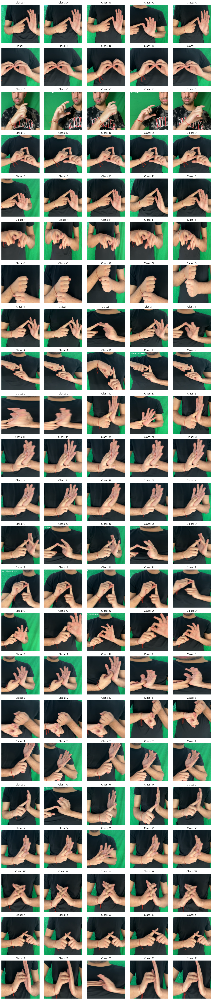

In [13]:
import os
import cv2
import random
import matplotlib.pyplot as plt

DATA_DIR = r"D:/BSL_DATASET_PROCESSED_FINAL"

IMAGE_SIZE = 128
samples_per_class = 5

# Get actual list of classes
class_names = sorted([c for c in os.listdir(DATA_DIR) if os.path.isdir(os.path.join(DATA_DIR, c))])
num_classes = len(class_names)

# Create subplots based on number of classes
fig, axes = plt.subplots(num_classes, samples_per_class, figsize=(samples_per_class * 3, num_classes * 3))

# If only one class, axes won't be 2D → fix shape
if num_classes == 1:
    axes = [axes]

for row, class_name in enumerate(class_names):
    class_dir = os.path.join(DATA_DIR, class_name)
    sample_images = random.sample(os.listdir(class_dir), min(samples_per_class, len(os.listdir(class_dir))))
    
    for col, img_file in enumerate(sample_images):
        img_path = os.path.join(class_dir, img_file)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axes[row, col].imshow(img)
        axes[row, col].set_title(f"Class: {class_name}")
        axes[row, col].axis('off')

plt.tight_layout()
plt.show()


In [21]:
import os
import json
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

IMAGE_SIZE = 128
BATCH_SIZE = 32
EPOCHS = 10
DATA_DIR = r"D:/BSL_DATASET_PROCESSED_FINAL"

In [22]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

DATA_DIR = r"D:/BSL_DATASET_PROCESSED_FINAL"

filepaths, labels = [], []
for class_name in os.listdir(DATA_DIR):
    class_path = os.path.join(DATA_DIR, class_name)
    if not os.path.isdir(class_path): continue
    for fname in os.listdir(class_path):
        if fname.lower().endswith(('jpg', 'jpeg', 'png')):
            filepaths.append(os.path.join(class_path, fname))
            labels.append(class_name)

df = pd.DataFrame({'filename': filepaths, 'class': labels})

train_val_df, test_df = train_test_split(df, test_size=0.1, stratify=df['class'], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df['class'], random_state=42)

print(f"Train: {len(train_df)}, Val: {len(val_df)}, Test: {len(test_df)}")

Train: 3302, Val: 826, Test: 459


In [23]:
data_gen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=25,
    zoom_range=0.2,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    brightness_range=(0.8, 1.2)
)

train_gen = data_gen.flow_from_dataframe(
    train_df, x_col='filename', y_col='class',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    class_mode='categorical',
    batch_size=BATCH_SIZE, shuffle=True
)

val_gen = data_gen.flow_from_dataframe(
    val_df, x_col='filename', y_col='class',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    class_mode='categorical',
    batch_size=BATCH_SIZE, shuffle=False
)

Found 3302 validated image filenames belonging to 23 classes.
Found 826 validated image filenames belonging to 23 classes.


In [24]:
label_map = {v: k for k, v in train_gen.class_indices.items()}
with open("label_map.json", "w") as f:
    json.dump(label_map, f)

In [25]:
base_model = MobileNetV2(input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3), include_top=False, weights='imagenet')
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

x = GlobalAveragePooling2D()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
out = Dense(len(label_map), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=out)
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [26]:
callbacks = [
    EarlyStopping(patience=3, restore_best_weights=True),
    ReduceLROnPlateau(patience=2, factor=0.5),
    ModelCheckpoint("bsl_final_model.keras", save_best_only=True)
]

history = model.fit(train_gen, validation_data=val_gen, epochs=EPOCHS, callbacks=callbacks)
print("\n✅ Training complete. Model saved as 'bsl_final_model.keras'")

C:\Users\Admin\anaconda3\envs\mp311\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 36s 279ms/step - accuracy: 0.8074 - loss: 0.6768 - val_accuracy: 0.5569 - val_loss: 3.0705 - learning_rate: 0.0010
Epoch 2/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 27s 258ms/step - accuracy: 0.9331 - loss: 0.2080 - val_accuracy: 0.2712 - val_loss: 10.2070 - learning_rate: 0.0010
Epoch 3/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 27s 261ms/step - accuracy: 0.9525 - loss: 0.1789 - val_accuracy: 0.6610 - val_loss: 2.8905 - learning_rate: 0.0010
Epoch 4/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 27s 256ms/step - accuracy: 0.9615 - loss: 0.1395 - val_accuracy: 0.4976 - val_loss: 5.7248 - learning_rate: 0.0010
Epoch 5/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 27s 258ms/step - accuracy: 0.9703 - loss: 0.1101 - val_accuracy: 0.6453 - val_loss: 3.1598 - learning_rate: 0.0010
Epoch 6/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 27s 258ms/step - accuracy: 0.9821 - loss: 0.0675 - val_accuracy: 0.7458 - val_loss: 1.8023 - learning_rate: 5.0000e-04
Epoch 7/10
104/104 ━━━━━━━━━━━━━━━━━━━━ 27s 262ms/step - accuracy

In [27]:
import tensorflow as tf
import json

model = tf.keras.models.load_model("bsl_final_model.keras")

with open("label_map.json") as f:
    label_map = json.load(f)
    label_map = {int(k): v for k, v in label_map.items()}

rev_map = {v: k for k, v in label_map.items()}

In [28]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

val_labels = val_gen.classes
pred_probs = model.predict(val_gen, verbose=0)
pred_classes = np.argmax(pred_probs, axis=1)

In [37]:
class_names = list(val_gen.class_indices.keys())
print("📋 Classification Report:")
print(classification_report(val_labels, pred_classes, target_names=class_names))

📋 Classification Report:
              precision    recall  f1-score   support

           A       1.00      1.00      1.00        36
           B       1.00      0.97      0.99        36
           C       1.00      1.00      1.00        36
           D       1.00      1.00      1.00        36
           E       1.00      1.00      1.00        36
           F       1.00      1.00      1.00        36
           G       1.00      1.00      1.00        36
           I       0.97      1.00      0.99        36
           K       1.00      1.00      1.00        36
           L       0.87      0.94      0.91        36
           M       0.68      1.00      0.81        36
           N       1.00      0.83      0.91        36
           O       1.00      0.97      0.99        36
           P       1.00      1.00      1.00        36
           Q       1.00      0.92      0.96        36
           R       0.88      1.00      0.94        36
           S       1.00      1.00      1.00        36
  

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import tensorflow as tf
import json
import mediapipe as mp

model = tf.keras.models.load_model("bsl_final_model.keras")

with open("label_map.json") as f:
    label_map = json.load(f)
    label_map = {int(k): v for k, v in label_map.items()}

mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=True, max_num_hands=1)

def detect_and_crop_hand(img):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    result = hands.process(img_rgb)
    if result.multi_hand_landmarks:
        h, w, _ = img.shape
        hand = result.multi_hand_landmarks[0]
        x_coords = [lm.x * w for lm in hand.landmark]
        y_coords = [lm.y * h for lm in hand.landmark]
        x1, x2 = int(min(x_coords)), int(max(x_coords))
        y1, y2 = int(min(y_coords)), int(max(y_coords))
        margin_x = int((x2 - x1) * 1.0)
        margin_y = int((y2 - y1) * 1.0)
        x1, y1 = max(0, x1 - margin_x), max(0, y1 - margin_y)
        x2, y2 = min(w, x2 + margin_x), min(h, y2 + margin_y)
        return img[y1:y2, x1:x2]
    return img

In [1]:
true_labels = []
pred_labels = []

for _, row in test_df.iterrows():
    true_label = row['class']
    img_path = row['filename']
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Could not read: {img_path}")
        continue

    cropped = detect_and_crop_hand(img)
    resized = cv2.resize(cropped, (128, 128))
    rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB).astype('float32') / 255.0
    input_img = np.expand_dims(rgb, axis=0)

    pred = model.predict(input_img, verbose=0)
    pred_class = np.argmax(pred)
    pred_label = label_map[pred_class]

    true_labels.append(true_label)
    pred_labels.append(pred_label)

    # Optional preview
    plt.imshow(rgb)
    plt.title(f"Predicted: {pred_label} | Actual: {true_label}")
    plt.axis('off')
    plt.show()

NameError: name 'test_df' is not defined

In [ ]:
print("\n📋 Classification Report:")
print(classification_report(true_labels, pred_labels))

cm = confusion_matrix(true_labels, pred_labels, labels=sorted(set(true_labels)))
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=sorted(set(true_labels)))
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Confusion Matrix - Test Set")
plt.tight_layout()
plt.show()

In [9]:
import tensorflow as tf
import json

model = tf.keras.models.load_model("bsl_final_model.keras")

with open("label_map.json") as f:
    label_map = json.load(f)
    label_map = {int(k): v for k, v in label_map.items()}

In [11]:
import cv2
import mediapipe as mp
import numpy as np

mp_hands = mp.solutions.hands
hands = mp_hands.Hands(static_image_mode=False, max_num_hands=1)

In [13]:
def detect_and_crop_hand(img):
    h, w, _ = img.shape
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    results = hands.process(img_rgb)
    if not results.multi_hand_landmarks:
        return None
    
    hand = results.multi_hand_landmarks[0]
    x_coords = [lm.x * w for lm in hand.landmark]
    y_coords = [lm.y * h for lm in hand.landmark]
    x1, x2 = int(min(x_coords)), int(max(x_coords))
    y1, y2 = int(min(y_coords)), int(max(y_coords))

    margin_x = int((x2 - x1) * 1.0)
    margin_y = int((y2 - y1) * 1.0)
    x1 = max(0, x1 - margin_x)
    y1 = max(0, y1 - margin_y)
    x2 = min(w, x2 + margin_x)
    y2 = min(h, y2 + margin_y)

    return img[y1:y2, x1:x2]

In [21]:
cap = cv2.VideoCapture(0)
print("📷 Webcam running... Press 'q' to quit")

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    cropped = detect_and_crop_hand(frame)
    display_frame = frame.copy()

    if cropped is not None:
        resized = cv2.resize(cropped, (128, 128))
        rgb = cv2.cvtColor(resized, cv2.COLOR_BGR2RGB).astype('float32') / 255.0
        input_img = np.expand_dims(rgb, axis=0)

        pred = model.predict(input_img, verbose=0)
        pred_class = np.argmax(pred)
        pred_label = label_map[pred_class]

        cv2.putText(display_frame, f"Prediction: {pred_label}", (10, 40),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

    cv2.imshow("BSL Live Prediction", display_frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

📷 Webcam running... Press 'q' to quit
